In [1]:
import sys
import os

#path_src = os.path.join(os.path.dirname(os.path.abspath(os.getcwd())))
path_src = os.path.dirname(os.path.dirname(os.path.dirname(os.getcwd())))
print(path_src)

sys.path.append(path_src)
os.chdir(path_src)

/home/giorgio6846/Code/Sign-AI/Sign-Giorgio


In [2]:
from src.mslm.dataloader.keypoint_dataset import KeypointDataset
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

/home/giorgio6846/miniconda3/envs/Sign/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
datasetPath = "/home/giorgio6846/Code/Sign-AI/data/processed/dataset_v5.hdf5"
kd = KeypointDataset(datasetPath, return_label=True)

In [4]:
def preview_video(index, random_video):
    if random_video:
        import random
        idx = random.randrange(0, len(kd))
    else:
        if index > len(kd):
            raise ValueError("index mayor a video")
        idx = index
    
    keypoints = kd[idx][0]
    print(kd[idx][0].size())
    print(kd[idx][2])

    fig, ax = plt.subplots(figsize=(6, 6))
    scat = ax.scatter(keypoints[1, :, 0], keypoints[1, :, 1], s=20, c='blue')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.invert_yaxis()
    ax.set_title("Frame 0")

    def update(frame_index):
        points = keypoints[frame_index]       # [250, 2]
        scat.set_offsets(points)           # Move every scatter point to new coords
        ax.set_title(f"Frame {frame_index}")
        return (scat,)
    
    anim = FuncAnimation(
        fig,
        update,
        frames=keypoints.shape[0],  # 148
        interval=33,             # 50 ms between frames (≈20 FPS)
        blit=True
    )
    return HTML(anim.to_jshtml())


torch.Size([244, 111, 2])
las vacunas combinadas, o vacunas que protegen contra múltiples enfermedades, ya son comunes.


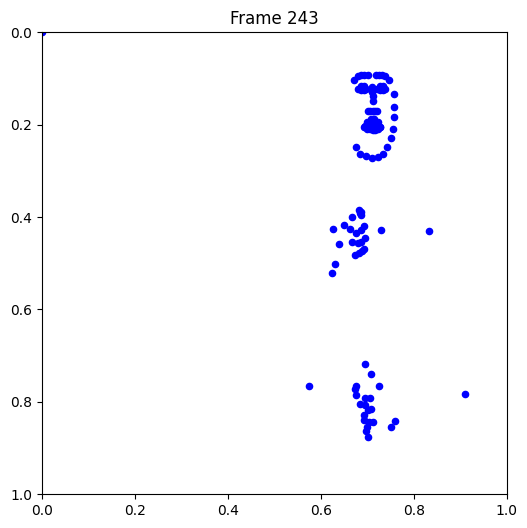

In [5]:
preview_video(10, False)

Se esta partiendo del datasetv5, con 111 kp. El target es detectar los casos de doble persona. Que tan frecuente es el error de deteccion por doble persona?. Limpia el dataset de casos de doble persona y analiza la frecuencia de errores de detección.

In [57]:
idx = 10
sample_kp = kd[idx][0]
sample_kp.size() 


torch.Size([244, 111, 2])

In [68]:
buen_frame = 59
mal_frame = 118
idx_f = mal_frame

Shape: torch.Size([263, 111, 2])
Extra info: no había información sobre esto, si las personas con discapacidad tenían derecho a votar y demás.


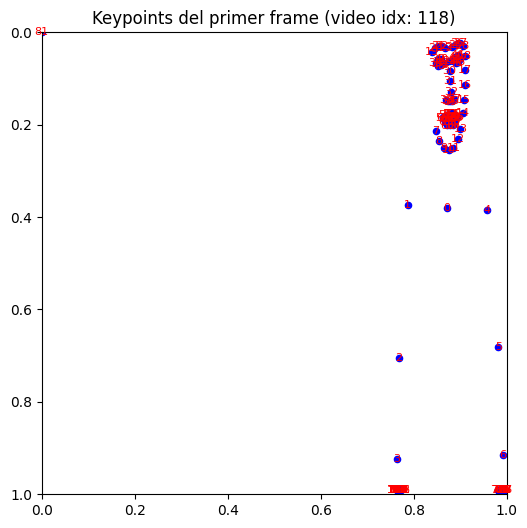

In [70]:

def plot_keypoints_with_indices(index):
    if index >= len(kd):
        raise ValueError("index fuera de rango")
    
    keypoints = kd[index][0]  # shape: (frames, keypoints, 2)
    print("Shape:", keypoints.size())
    print("Extra info:", kd[index][2])  # opcional

    frame_kp = keypoints[0]  # primer frame, shape: (keypoints, 2)

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.scatter(frame_kp[:, 0], frame_kp[:, 1], s=20, c='blue')

    # Agregar índice en cada keypoint
    for i, (x, y) in enumerate(frame_kp):
        ax.text(x, y, str(i), fontsize=8, ha='center', va='center', color='red')

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.invert_yaxis()
    ax.set_title(f"Keypoints del primer frame (video idx: {index})")
    plt.show()
    
plot_keypoints_with_indices(idx_f)



Dbscan mas rapido

In [71]:
from sklearn.cluster import DBSCAN
import numpy as np
import torch

def frame_afectado_por_varias_personas(frame_kp, eps=0.15, min_samples=5, min_kp_por_cluster=15):
    if isinstance(frame_kp, torch.Tensor):
        frame_kp = frame_kp.cpu().numpy()

    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(frame_kp)
    labels = clustering.labels_

    # Contar clústers válidos (excluyendo ruido -1)
    clústeres = set(labels) - {-1}
    n_validos = sum((labels == label).sum() >= min_kp_por_cluster for label in clústeres)

    return n_validos >= 2  # más de una persona detectada

def detectar_videos_afectados(kd):
    videos_afectados = []
    resumen = {}

    for i, (kp_tensor, *resto) in enumerate(kd):
        frames_afectados = 0

        for f in range(kp_tensor.shape[0]):
            frame_kp = kp_tensor[f]
            if frame_kp.shape[0] < 60:  # ya está limpio
                continue
            if frame_afectado_por_varias_personas(frame_kp):
                frames_afectados += 1

        if frames_afectados > 0:
            videos_afectados.append(i)
            resumen[i] = frames_afectados

    print(f"Videos afectados: {len(videos_afectados)} / {len(kd)}")
    return videos_afectados, resumen


In [77]:
def detectar_videos_afectados(kd, max_videos=10):
    videos_afectados = []
    resumen = {}

    for i in range(max_videos):
        kp_tensor, *resto = kd[i]
        frames_afectados = 0

        for f in range(kp_tensor.shape[0]):
            frame_kp = kp_tensor[f]
            if frame_kp.shape[0] < 60:
                continue
            if frame_afectado_por_varias_personas(frame_kp):
                frames_afectados += 1

        if frames_afectados > 0:
            videos_afectados.append(i)
            resumen[i] = frames_afectados

    print(f"Videos afectados (entre los primeros {max_videos}): {len(videos_afectados)}")
    return videos_afectados, resumen


In [78]:
videos_afectados, resumen = detectar_videos_afectados(kd, max_videos=10)
print(resumen)


Videos afectados (entre los primeros 10): 10
{0: 194, 1: 245, 2: 168, 3: 459, 4: 275, 5: 99, 6: 103, 7: 162, 8: 156, 9: 199}


NameError: name 'preview_afectado' is not defined

In [88]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def preview_video(index, random_video):
    if random_video:
        import random
        idx = random.randrange(0, len(kd))
    else:
        if index >= len(kd):
            raise ValueError("index mayor a video")
        idx = index

    keypoints = kd[idx][0]
    print(keypoints.size())
    print(kd[idx][2])

    fig, ax = plt.subplots(figsize=(6, 6))
    scat = ax.scatter(keypoints[1, :, 0], keypoints[1, :, 1], s=20, c='blue')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.invert_yaxis()
    ax.set_title("Frame 0")

    def update(frame_index):
        points = keypoints[frame_index]
        scat.set_offsets(points)
        ax.set_title(f"Frame {frame_index}")
        return (scat,)

    anim = FuncAnimation(
        fig,
        update,
        frames=keypoints.shape[0],
        interval=33,
        blit=True
    )
    return HTML(anim.to_jshtml())


In [89]:
def preview_afectado(n=0):
    if n >= len(videos_afectados):
        raise ValueError("Índice fuera de los videos afectados")

    idx = videos_afectados[n]
    return preview_video(idx, random_video=False)


torch.Size([225, 111, 2])
¿qué es el agua? el agua es un recurso natural.


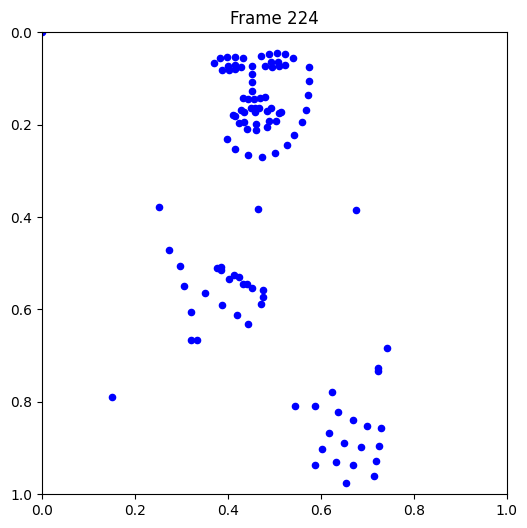

In [90]:
preview_afectado(0)


DBSCAN no sirve, la idea seria estimar el lado predominante segun los hombros y centro. Luego marcar los frames que tengan la cabeza fuera de 1.5 veces el ancho de hombros despues del hombro izquierdo (caso el signate este a la izquierda) o despues del hombro derecho (en caso el signante este a la derecha). Luego validaremos la manos,

Guia de implementacion:
1. Definir los rangos de los keypoints para detectar el lado del signante:
   - Hombro izquierdo, derecho y centro (kp 0)
   - mano izquierda y derecha 
   - cabeza
   - brazos y codos 


2. Primero estimar el lado del signante, utilizando los hombros y el kp 0.
    - Si de media estos 3 puntos 
